# Can you predict which NBA players will make the "All-Star" team?

## Part one: Clean the data

#### Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#### Load 'player_data.csv' 

In [2]:
player_df = pd.read_csv('player_data.csv')

In [3]:
player_df.head()

,Unnamed: 0,Year,Player,Pos,Age,Tm,G,PER,TS%,ORB%,...,3P%,2P%,eFG%,FT%,TRB,AST,STL,BLK,TOV,PTS
0,0,1950.0,Curly Armstrong,G-F,31.0,FTW,63.0,NaN,0.368,NaN,...,NaN,0.279,0.279,0.705,NaN,176.0,NaN,NaN,NaN,458.0
1,1,1950.0,Cliff Barker,SG,29.0,INO,49.0,NaN,0.435,NaN,...,NaN,0.372,0.372,0.708,NaN,109.0,NaN,NaN,NaN,279.0
2,2,1950.0,Leo Barnhorst,SF,25.0,CHS,67.0,NaN,0.394,NaN,...,NaN,0.349,0.349,0.698,NaN,140.0,NaN,NaN,NaN,438.0
3,3,1950.0,Ed Bartels,F,24.0,TOT,15.0,NaN,0.312,NaN,...,NaN,0.256,0.256,0.559,NaN,20.0,NaN,NaN,NaN,63.0
4,4,1950.0,Ed Bartels,F,24.0,DNN,13.0,NaN,0.308,NaN,...,NaN,0.256,0.256,0.548,NaN,20.0,NaN,NaN,NaN,59.0


In [4]:
player_df.tail()

,Unnamed: 0,Year,Player,Pos,Age,Tm,G,PER,TS%,ORB%,...,3P%,2P%,eFG%,FT%,TRB,AST,STL,BLK,TOV,PTS
24686,24686,2017.0,Cody Zeller,PF,24.0,CHO,62.0,16.7,0.604,8.6,...,0.000,0.572,0.571,0.679,405.0,99.0,62.0,58.0,65.0,639.0
24687,24687,2017.0,Tyler Zeller,C,27.0,BOS,51.0,13.0,0.508,9.2,...,0.000,0.497,0.494,0.564,124.0,42.0,7.0,21.0,20.0,178.0
24688,24688,2017.0,Stephen Zimmerman,C,20.0,ORL,19.0,7.3,0.346,10.8,...,NaN,0.323,0.323,0.600,35.0,4.0,2.0,5.0,3.0,23.0
24689,24689,2017.0,Paul Zipser,SF,22.0,CHI,44.0,6.9,0.503,1.9,...,0.333,0.451,0.473,0.775,125.0,36.0,15.0,16.0,40.0,240.0
24690,24690,2017.0,Ivica Zubac,C,19.0,LAL,38.0,17.0,0.547,7.1,...,0.000,0.536,0.529,0.653,159.0,30.0,14.0,33.0,30.0,284.0


In [5]:
player_df.columns

Index(['Unnamed: 0', 'Year', 'Player', 'Pos', 'Age', 'Tm', 'G', 'PER', 'TS%',
       'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'WS', 'BPM',
       'VORP', 'FG%', '3P%', '2P%', 'eFG%', 'FT%', 'TRB', 'AST', 'STL', 'BLK',
       'TOV', 'PTS'],
      dtype='object')

In [6]:
player_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24691 entries, 0 to 24690
Data columns (total 30 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  24691 non-null  int64  
 1   Year        24624 non-null  float64
 2   Player      24624 non-null  object 
 3   Pos         24624 non-null  object 
 4   Age         24616 non-null  float64
 5   Tm          24624 non-null  object 
 6   G           24624 non-null  float64
 7   PER         24101 non-null  float64
 8   TS%         24538 non-null  float64
 9   ORB%        20792 non-null  float64
 10  DRB%        20792 non-null  float64
 11  TRB%        21571 non-null  float64
 12  AST%        22555 non-null  float64
 13  STL%        20792 non-null  float64
 14  BLK%        20792 non-null  float64
 15  TOV%        19582 non-null  float64
 16  WS          24585 non-null  float64
 17  BPM         20797 non-null  float64
 18  VORP        20797 non-null  float64
 19  FG%         24525 non-nul

#### Drop the first column

In [7]:
player_df.drop('Unnamed: 0',axis=1,inplace=True)

#### Remove null values from "Players" column

In [8]:
sum(player_df['Player'].isnull())

67

In [9]:
player_null_values = player_df['Player'][player_df['Player'].isnull()].index

In [10]:
player_df.drop(player_df['Player'][player_df['Player'].isnull()].index,axis=0,inplace=True)

In [11]:
sum(player_df['Player'].isnull())

0

#### Replace null values with 0's in the '3P%' column

In [12]:
player_df['3P%']

0          NaN
1          NaN
2          NaN
3          NaN
4          NaN
         ...  
24686    0.000
24687    0.000
24688      NaN
24689    0.333
24690    0.000
Name: 3P%, Length: 24624, dtype: float64

In [13]:
player_df['3P%'].fillna(0,inplace=True)

In [14]:
player_df['3P%']

0        0.000
1        0.000
2        0.000
3        0.000
4        0.000
         ...  
24686    0.000
24687    0.000
24688    0.000
24689    0.333
24690    0.000
Name: 3P%, Length: 24624, dtype: float64

#### Remove rows for players who started their careers before the 1980 season

In [15]:
players_pre_1980 = list(player_df[player_df['Year'] < 1980]['Player'].unique())

*checking for players with the same name*

In [16]:
player_post_2000 = list(player_df[player_df['Year'] >= 2000]['Player'].unique())

In [17]:
same_name = []
for player in players_pre_1980:
    for player2 in player_post_2000:
        if player == player2:
            same_name.append(player)

In [18]:
same_name

['Luke Jackson',
 'Greg Smith',
 'Mike Dunleavy',
 'Bobby Jones',
 'John Lucas',
 'Larry Johnson']

*removing from player_pre_1980 list*

In [19]:
for name in same_name:
    players_pre_1980.remove(name)

In [20]:
pre_1980_index = []
for player in players_pre_1980:
    for index in player_df[player_df['Player'] == player].index:
        pre_1980_index.append(index)

In [21]:
player_df.drop(pre_1980_index,axis=0,inplace=True)

In [22]:
player_df.head()

,Year,Player,Pos,Age,Tm,G,PER,TS%,ORB%,DRB%,...,3P%,2P%,eFG%,FT%,TRB,AST,STL,BLK,TOV,PTS
2144,1965.0,Luke Jackson,PF,23.0,PHI,76.0,15.2,0.473,NaN,NaN,...,0.0,0.414,0.414,0.713,980.0,93.0,NaN,NaN,NaN,1126.0
2277,1966.0,Luke Jackson,PF,24.0,PHI,79.0,12.3,0.459,NaN,NaN,...,0.0,0.401,0.401,0.738,676.0,132.0,NaN,NaN,NaN,650.0
2409,1967.0,Luke Jackson,PF,25.0,PHI,81.0,12.3,0.487,NaN,NaN,...,0.0,0.438,0.438,0.759,724.0,114.0,NaN,NaN,NaN,970.0
2560,1968.0,Luke Jackson,PF,26.0,PHI,82.0,12.4,0.471,NaN,NaN,...,0.0,0.433,0.433,0.719,872.0,139.0,NaN,NaN,NaN,968.0
2749,1969.0,Luke Jackson,C,27.0,PHI,25.0,14.2,0.479,NaN,NaN,...,0.0,0.437,0.437,0.711,286.0,54.0,NaN,NaN,NaN,359.0


*now we will remove players with the same name but whose career started pre 1980*

In [23]:
same_name_pre_1980_index = []
for player in same_name:
    for index in player_df[(player_df['Player'] == player) & (player_df['Year'] < 1980)].index:
        same_name_pre_1980_index.append(index)

In [24]:
player_df.drop(same_name_pre_1980_index,axis=0,inplace=True)

In [25]:
player_df.head()

,Year,Player,Pos,Age,Tm,G,PER,TS%,ORB%,DRB%,...,3P%,2P%,eFG%,FT%,TRB,AST,STL,BLK,TOV,PTS
5733,1980.0,James Bailey,PF,22.0,SEA,67.0,12.3,0.495,10.2,18.3,...,0.000,0.450,0.450,0.673,197.0,28.0,21.0,54.0,79.0,312.0
5741,1980.0,Billy Ray,SG,23.0,POR,16.0,24.1,0.552,6.0,7.6,...,0.421,0.504,0.521,0.718,29.0,31.0,14.0,2.0,20.0,180.0
5748,1980.0,Larry Bird*,PF,23.0,BOS,82.0,20.5,0.538,8.3,23.6,...,0.406,0.481,0.494,0.836,852.0,370.0,143.0,53.0,263.0,1745.0
5753,1980.0,Lawrence Boston,PF,23.0,WSB,13.0,12.6,0.485,15.1,16.2,...,0.000,0.462,0.462,0.615,39.0,2.0,4.0,2.0,8.0,56.0
5759,1980.0,Dudley Bradley,SG,22.0,IND,82.0,13.5,0.502,3.4,8.1,...,0.400,0.452,0.453,0.782,223.0,252.0,211.0,48.0,166.0,688.0


#### Load in the 'all_star_appearances.pickle' file and use this data to create a column called 'all_star' that indicates whether or not a player made the All-Star team for a given year
- This file is a dictionary in which the keys are players who've made an All-Star team in their careers
- The values are all the years that the corresponding player made an All-Star team

In [26]:
import pickle
pickle_file = open("all_star_appearances.pickle", "rb")
all_star_players = pickle.load(pickle_file)
pickle_file.close()

In [27]:
all_star_players

defaultdict(set,
            {'Julius Erving': {1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987},
             'Jack Sikma': {1980, 1981, 1982, 1983, 1984, 1985},
             'Dan Roundfield': {1980, 1981, 1982},
             'Dennis Johnson': {1980, 1981, 1982, 1985},
             'Tiny Archibald': {1980, 1981, 1982},
             'Kareem Abdul-Jabbar': {1980,
              1981,
              1982,
              1983,
              1984,
              1985,
              1986,
              1987,
              1988,
              1989},
             'Eddie Johnson': {1980, 1981},
             'Otis Birdsong': {1980, 1981, 1984},
             'Magic Johnson': {1980,
              1982,
              1983,
              1984,
              1985,
              1986,
              1987,
              1988,
              1989,
              1990,
              1991,
              1992},
             'Kermit Washington': {1980},
             'Bill Cartwright': {1980},
             'John Dr

In [28]:
player_df['all_star_players'] = player_df['Player'].replace(all_star_players)

In [29]:
player_df['all_star_players'] = player_df['all_star_players'].apply(lambda x : list(x) ) 

In [30]:
player_df.reset_index(drop=True,inplace=True)

In [31]:
player_df['all_star'] = 0

In [32]:
for num in range(len(player_df)):
    player_df['all_star'][num] = int(player_df['Year'].loc[num]) in player_df['all_star_players'].loc[num] 

C:\Users\Sumant Duggal\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Sumant Duggal\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [33]:
player_df['all_star'] = player_df['all_star'].replace({True:1,False:0})

In [34]:
player_df.drop('all_star_players',axis=1,inplace=True)

In [35]:
player_df

,Year,Player,Pos,Age,Tm,G,PER,TS%,ORB%,DRB%,...,2P%,eFG%,FT%,TRB,AST,STL,BLK,TOV,PTS,all_star
0,1980.0,James Bailey,PF,22.0,SEA,67.0,12.3,0.495,10.2,18.3,...,0.450,0.450,0.673,197.0,28.0,21.0,54.0,79.0,312.0,0
1,1980.0,Billy Ray,SG,23.0,POR,16.0,24.1,0.552,6.0,7.6,...,0.504,0.521,0.718,29.0,31.0,14.0,2.0,20.0,180.0,0
2,1980.0,Larry Bird*,PF,23.0,BOS,82.0,20.5,0.538,8.3,23.6,...,0.481,0.494,0.836,852.0,370.0,143.0,53.0,263.0,1745.0,0
3,1980.0,Lawrence Boston,PF,23.0,WSB,13.0,12.6,0.485,15.1,16.2,...,0.462,0.462,0.615,39.0,2.0,4.0,2.0,8.0,56.0,0
4,1980.0,Dudley Bradley,SG,22.0,IND,82.0,13.5,0.502,3.4,8.1,...,0.452,0.453,0.782,223.0,252.0,211.0,48.0,166.0,688.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17484,2017.0,Cody Zeller,PF,24.0,CHO,62.0,16.7,0.604,8.6,17.3,...,0.572,0.571,0.679,405.0,99.0,62.0,58.0,65.0,639.0,0
17485,2017.0,Tyler Zeller,C,27.0,BOS,51.0,13.0,0.508,9.2,17.0,...,0.497,0.494,0.564,124.0,42.0,7.0,21.0,20.0,178.0,0
17486,2017.0,Stephen Zimmerman,C,20.0,ORL,19.0,7.3,0.346,10.8,24.9,...,0.323,0.323,0.600,35.0,4.0,2.0,5.0,3.0,23.0,0
17487,2017.0,Paul Zipser,SF,22.0,CHI,44.0,6.9,0.503,1.9,14.2,...,0.451,0.473,0.775,125.0,36.0,15.0,16.0,40.0,240.0,0


#### Make sure this column is binary where 1 = Made All-Star team, and 0 = Did not make All-Star team

In [36]:
player_df['all_star'].value_counts()/len(player_df)*100

0    96.803705
1     3.196295
Name: all_star, dtype: float64

## Part 2: Exploratory data analysis

#### Generate descriptive stats for the features

In [37]:
player_df.describe()

,Year,Age,G,PER,TS%,ORB%,DRB%,TRB%,AST%,STL%,...,2P%,eFG%,FT%,TRB,AST,STL,BLK,TOV,PTS,all_star
count,17489.000000,17489.000000,17489.000000,17484.000000,17413.000000,17484.000000,17484.000000,17484.000000,17484.000000,17484.000000,...,17372.000000,17401.000000,16758.000000,17489.000000,17489.000000,17489.000000,17489.000000,17489.000000,17489.000000,17489.000000
mean,2001.652982,26.648522,48.922408,12.332773,0.503056,6.137743,13.810198,9.974983,13.034043,1.654644,...,0.456190,0.463789,0.719206,199.292698,107.027617,37.818286,23.514724,69.908914,471.018183,0.031963
std,9.880128,3.971698,26.682018,6.299678,0.096353,5.042834,6.624038,5.089722,9.677230,1.042016,...,0.102031,0.100311,0.148624,199.936014,136.063470,37.351732,35.770643,65.102498,470.574124,0.175906
min,1980.000000,18.000000,1.000000,-90.600000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1994.000000,24.000000,25.000000,9.600000,0.472000,2.500000,9.000000,6.000000,6.200000,1.100000,...,0.421000,0.432000,0.654000,44.000000,15.000000,8.000000,3.000000,16.000000,88.000000,0.000000
50%,2002.000000,26.000000,53.000000,12.600000,0.516000,5.200000,12.800000,9.200000,10.200000,1.500000,...,0.466000,0.475000,0.746000,140.000000,58.000000,27.000000,11.000000,52.000000,323.000000,0.000000
75%,2010.000000,29.000000,75.000000,15.500000,0.551000,9.000000,18.100000,13.400000,17.800000,2.100000,...,0.502000,0.511000,0.812000,288.000000,145.000000,57.000000,28.000000,106.000000,727.000000,0.000000
max,2017.000000,44.000000,85.000000,129.100000,1.136000,100.000000,100.000000,100.000000,100.000000,24.200000,...,1.000000,1.500000,1.000000,1530.000000,1164.000000,301.000000,456.000000,464.000000,3041.000000,1.000000


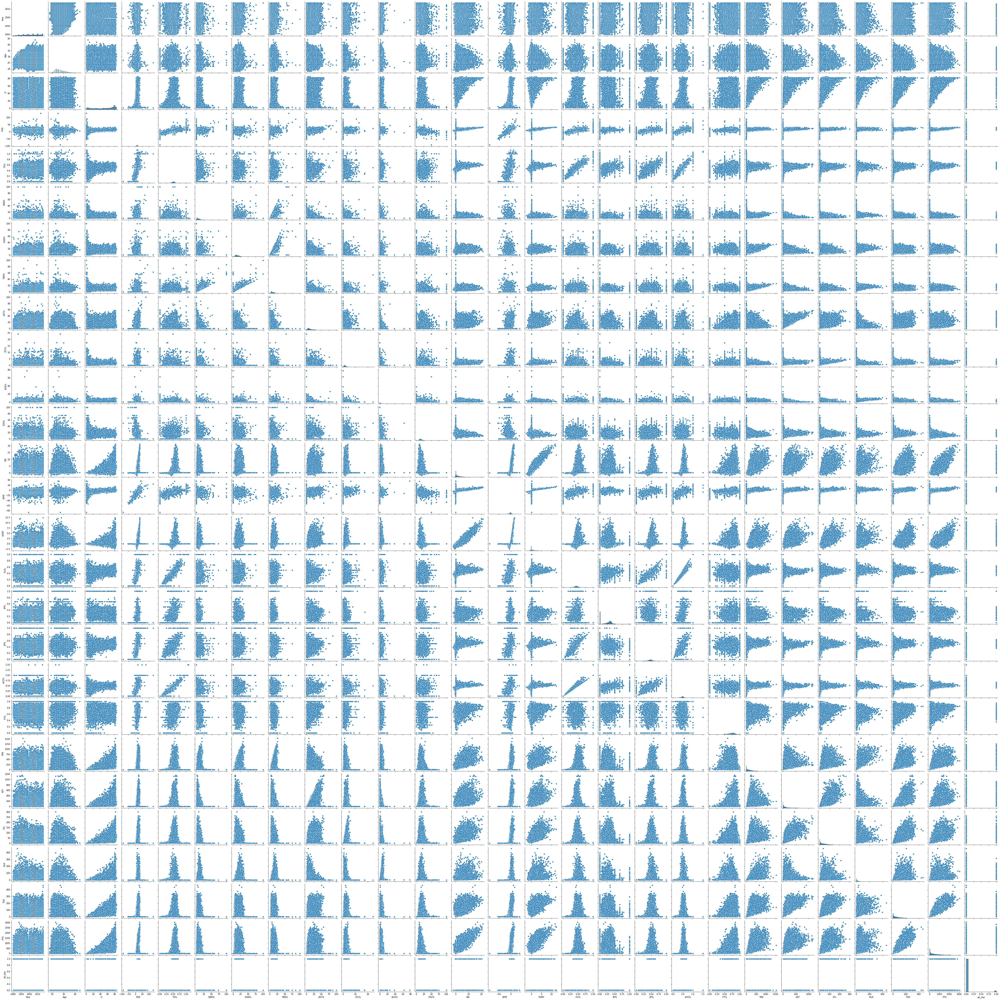

In [38]:
sns.pairplot(player_df)

#### Create a corr map of the features

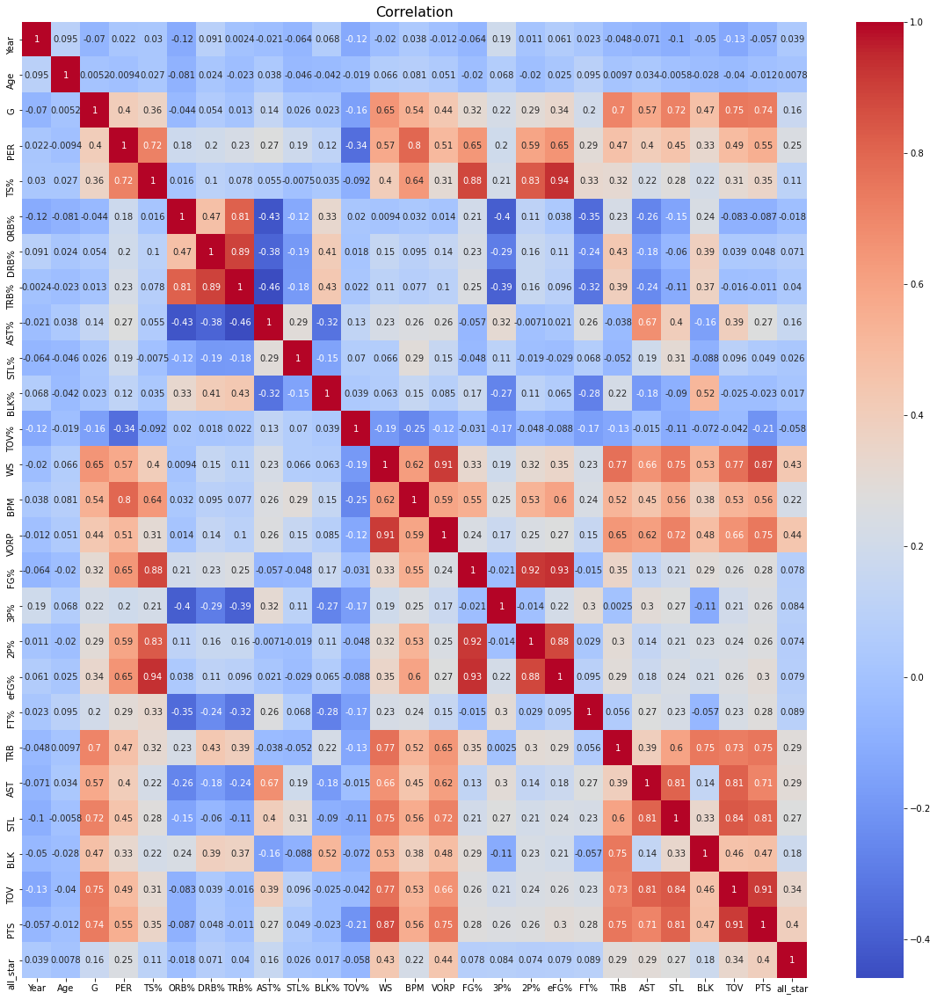

In [39]:
plt.figure(figsize=(20,20))
sns.heatmap(player_df.corr(),cmap='coolwarm',annot=True)
plt.title('Correlation',size = 16);

*correlation with target variable*

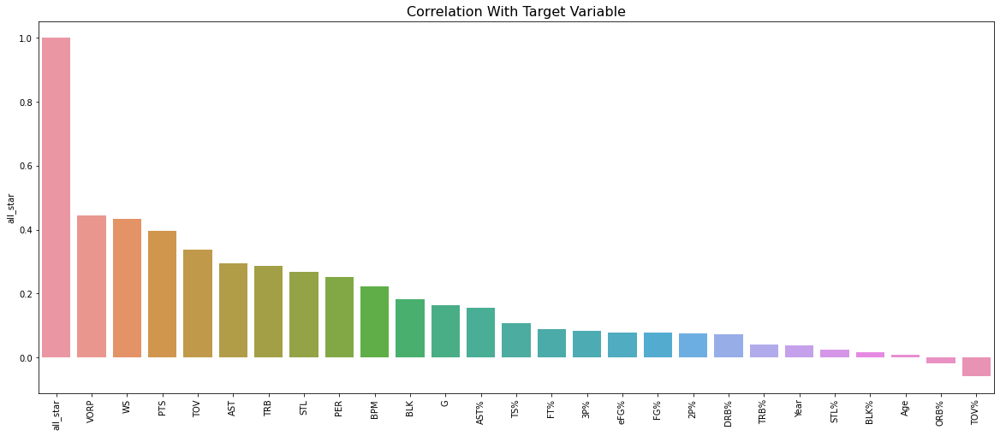

In [40]:
plt.figure(figsize=(20,8))
sns.barplot(x= player_df.corr()['all_star'].sort_values(ascending = False).index,y= player_df.corr()['all_star'].sort_values(ascending = False))
plt.title('Correlation With Target Variable',size=16)
plt.xticks(rotation=90);

*highly positive correlation - threshold 0.8*

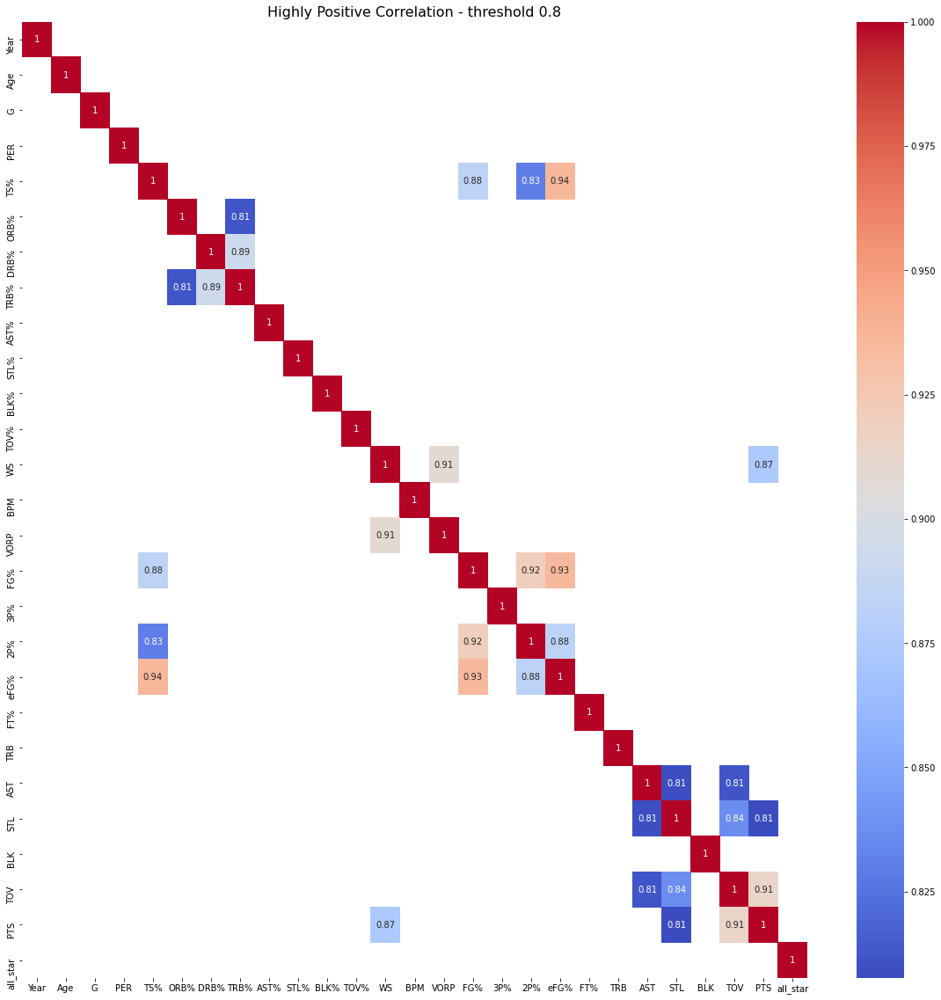

In [41]:
plt.figure(figsize=(20,20))
sns.heatmap(player_df.corr()[player_df.corr() > 0.80],cmap='coolwarm',annot=True)
plt.title('Highly Positive Correlation - threshold 0.8',size=16);

*highly negative correlation - threshold -0.8*

C:\Users\Sumant Duggal\anaconda3\lib\site-packages\seaborn\matrix.py:194: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\Sumant Duggal\anaconda3\lib\site-packages\seaborn\matrix.py:199: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


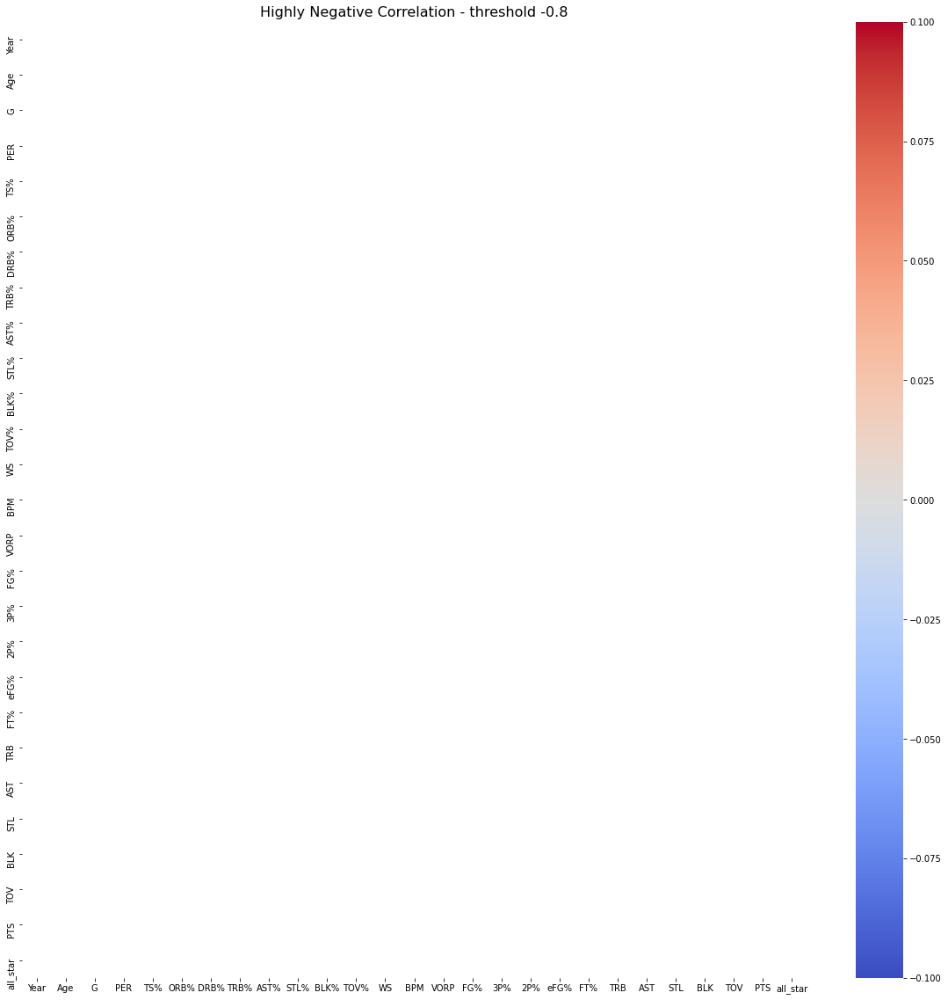

In [42]:
plt.figure(figsize=(20,20))
sns.heatmap(player_df.corr()[player_df.corr() < -0.80],cmap='coolwarm',annot=True)
plt.title('Highly Negative Correlation - threshold -0.8',size=16);

#### Graph the distibution of the 'Age' feature

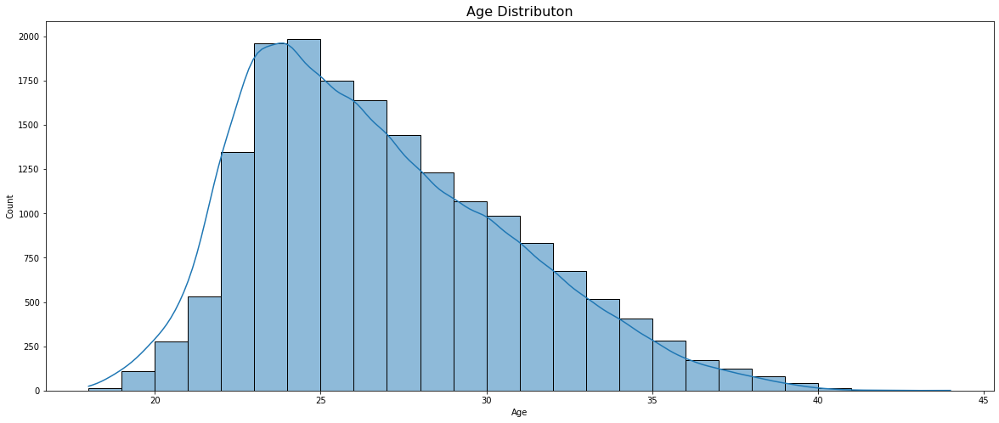

In [43]:
plt.figure(figsize=(20,8))
sns.histplot(x=player_df['Age'],kde=True,bins=50,binwidth=1)
plt.title('Age Distributon',size=16);

## Part 3: Classification

### Build a classifier that predicts whether or not a player makes an All-Star team based on their stats for that season

*dealing with missing values*

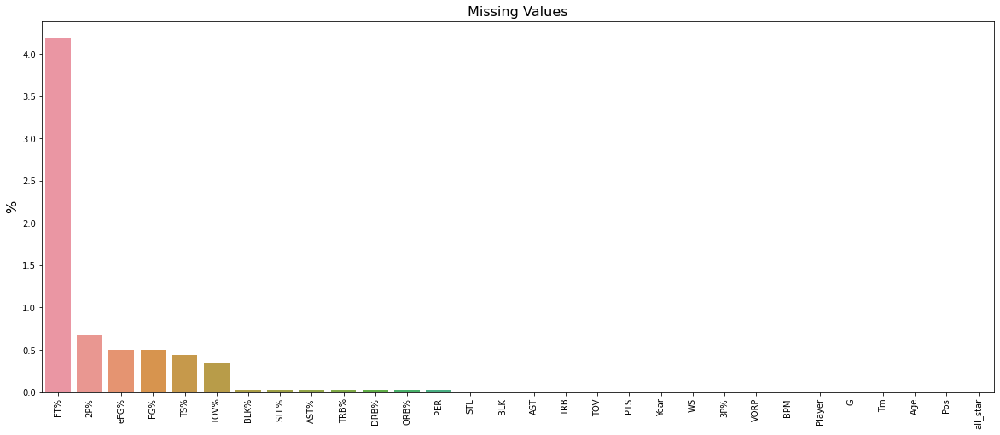

In [44]:
missing_values = player_df.isnull().sum()/len(player_df)*100
plt.figure(figsize=(20,8))
sns.barplot(x= missing_values.sort_values(ascending = False).index,y = missing_values.sort_values(ascending = False))
plt.xticks(rotation=90)
plt.ylabel('%',size=16)
plt.title('Missing Values',size=16);

as the missing values account for so little we can disregard them

In [45]:
player_df.dropna(inplace=True)

*importing train and test split library*

In [46]:
from sklearn.model_selection import train_test_split

In [47]:
player_df.columns

Index(['Year', 'Player', 'Pos', 'Age', 'Tm', 'G', 'PER', 'TS%', 'ORB%', 'DRB%',
       'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'WS', 'BPM', 'VORP', 'FG%',
       '3P%', '2P%', 'eFG%', 'FT%', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PTS',
       'all_star'],
      dtype='object')

In [48]:
X = pd.get_dummies(player_df.drop(['Year','Player','FG%','2P%','eFG%','TRB%','WS','FG%','STL','TOV','all_star'],axis=1))
y = player_df['all_star']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

*given the unbalanced nature of the target variable we will use 2 methods in order to determine a good model*

1. Random Forest with Bootstrapping set to True
2. Oversampling

**Random Forest with Bootstrapping set to True**

In [49]:
from sklearn.ensemble import RandomForestClassifier

In [50]:
model_random_bot = RandomForestClassifier(bootstrap=True)

In [51]:
model_random_bot.fit(X_train,y_train)
predictions = model_random_bot.predict(X_test)

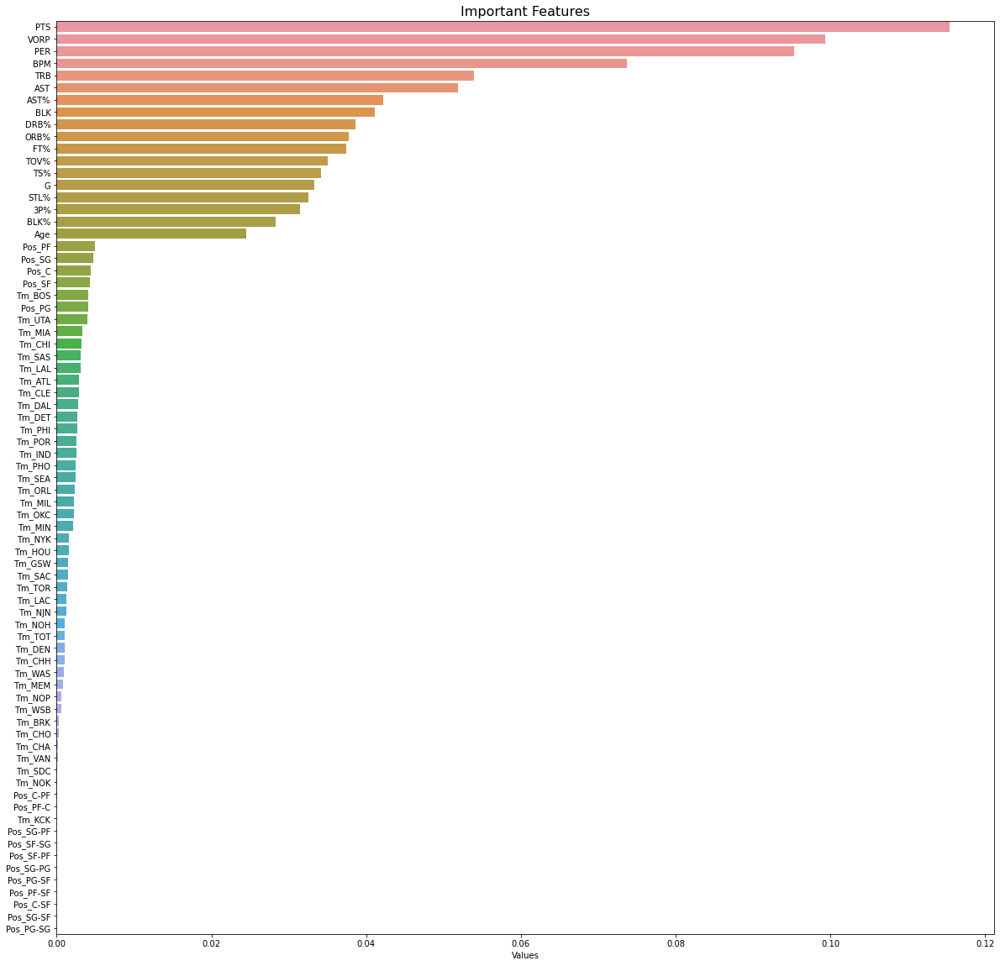

In [52]:
important_features = pd.DataFrame(model_random_bot.feature_importances_,X.columns,columns=['Values'])
plt.figure(figsize=(20,20))
sns.barplot(y=important_features['Values'].sort_values(ascending=False).index,x=important_features['Values'].sort_values(ascending=False))
plt.title('Important Features',size=16);

*top 3 features to identify all_star are PTS,VORP and PER*

In [56]:
from sklearn.metrics import matthews_corrcoef,roc_auc_score,classification_report

In [57]:
print(f'Given the unbalanced nature of the target variable we calculate Matthews_Coeff which is {matthews_corrcoef(y_test,predictions)}')
print(f'ROC_AUC score is {roc_auc_score(y_test,predictions)}')

Given the unbalanced nature of the target variable we calculate Matthews_Coeff which is 0.48343183887316393
ROC_AUC score is 0.6539530569808667


In [58]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3245
           1       0.78      0.31      0.44       103

    accuracy                           0.98      3348
   macro avg       0.88      0.65      0.72      3348
weighted avg       0.97      0.98      0.97      3348



**Random Forest using oversampling using SMOTE** 

In [59]:
from imblearn.over_sampling import SMOTE

In [60]:
sm = SMOTE()

In [61]:
X = pd.get_dummies(player_df.drop(['Year','Player','FG%','2P%','eFG%','TRB%','WS','FG%','STL','TOV','all_star'],axis=1))
y = player_df['all_star']

In [62]:
X_sm, y_sm = sm.fit_resample(X, y)

print(f'''Shape of X before SMOTE: {X.shape}
Shape of X after SMOTE: {X_sm.shape}''')

print('\nBalance classes (%):')
y_sm.value_counts(normalize=True)*100

Shape of X before SMOTE: (16737, 75)
Shape of X after SMOTE: (32356, 75)

Balance classes (%):


0    50.0
1    50.0
Name: all_star, dtype: float64

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.2, random_state=42)

In [64]:
model_random_forest = RandomForestClassifier()

In [65]:
model_random_forest.fit(X_train,y_train)
predictions = model_random_forest.predict(X_test)

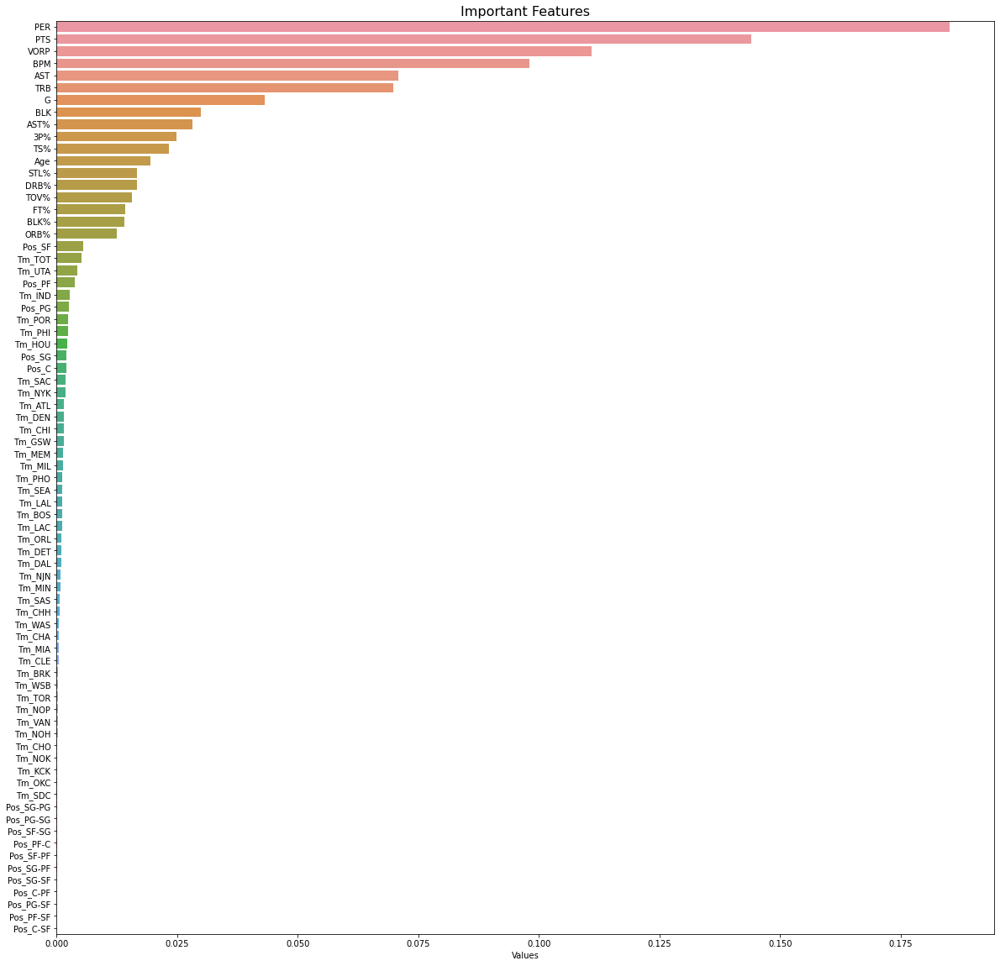

In [66]:
important_features = pd.DataFrame(model_random_forest.feature_importances_,X.columns,columns=['Values'])
plt.figure(figsize=(20,20))
sns.barplot(y=important_features['Values'].sort_values(ascending=False).index,x=important_features['Values'].sort_values(ascending=False))
plt.title('Important Features',size=16);

In [67]:
print(f'Given the unbalanced nature of the target variable we calculate Matthews_Coeff which is {matthews_corrcoef(y_test,predictions)}')
print(f'ROC_AUC score is {roc_auc_score(y_test,predictions)}')

Given the unbalanced nature of the target variable we calculate Matthews_Coeff which is 0.9793726604133565
ROC_AUC score is 0.9897505726550754


In [68]:
from sklearn.metrics import classification_report

In [69]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3290
           1       0.98      1.00      0.99      3182

    accuracy                           0.99      6472
   macro avg       0.99      0.99      0.99      6472
weighted avg       0.99      0.99      0.99      6472



**Random Forest manual oversampling**

*in order to bring the ratio of 0 and 1 to 60:40 we need to multiply oversample the 1s by 18 times* 

In [70]:
all_star_players = player_df[player_df['all_star']==1]

In [71]:
all_star_players_df = pd.concat([all_star_players]*18,axis=0)

In [72]:
player_df_oversampled = pd.concat([player_df,all_star_players_df],axis=0)

In [73]:
player_df_oversampled['all_star'].value_counts()

0    16178
1    10621
Name: all_star, dtype: int64

*splitting the data*

In [74]:
X = pd.get_dummies(player_df_oversampled.drop(['Year','Player','FG%','2P%','eFG%','TRB%','WS','FG%','STL','TOV','all_star'],axis=1))
y = player_df_oversampled['all_star']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [76]:
model_random_forest_oversample = RandomForestClassifier()

*model*

In [77]:
model_random_forest_oversample.fit(X_train,y_train)
predictions = model_random_forest_oversample.predict(X_test)

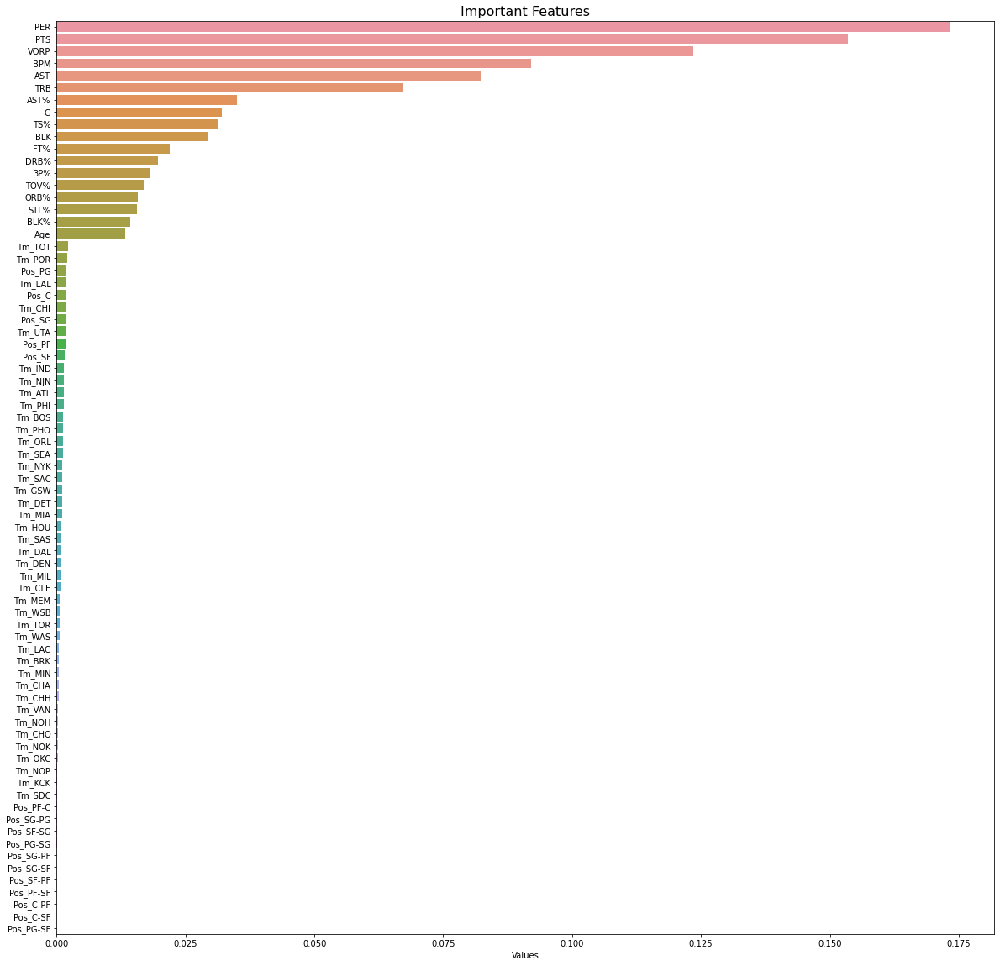

In [78]:
important_features = pd.DataFrame(model_random_forest_oversample.feature_importances_,X.columns,columns=['Values'])
plt.figure(figsize=(20,20))
sns.barplot(y=important_features['Values'].sort_values(ascending=False).index,x=important_features['Values'].sort_values(ascending=False))
plt.title('Important Features',size=16);

In [79]:
print(f'Given the unbalanced nature of the target variable we calculate Matthews_Coeff which is {matthews_corrcoef(y_test,predictions)}')
print(f'ROC_AUC score is {roc_auc_score(y_test,predictions)}')

Given the unbalanced nature of the target variable we calculate Matthews_Coeff which is 0.989123936016501
ROC_AUC score is 0.9957055214723927


In [80]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3260
           1       0.99      1.00      0.99      2100

    accuracy                           0.99      5360
   macro avg       0.99      1.00      0.99      5360
weighted avg       0.99      0.99      0.99      5360



## Conclusion

Given the unbalanced nature of our data we use bootstrapping and oversampling to find the optimum model.

Despite using bootstrapping we observe a lower Matthew Coefficient Score and ROC Score, this could be due to the fact that the number of 1s is far too low for bootstrapping to have an impact

Hence Oversampling using SMOTE or by manual methods allow us to effectively balance out the data and allow the model to learn better without HyperParameter Tuning

## Appendix

*interesting observation using decison tree*

In [81]:
from sklearn.tree import DecisionTreeClassifier

In [82]:
model_tree = DecisionTreeClassifier()

In [83]:
X = pd.get_dummies(player_df_oversampled.drop(['Year','Player','FG%','2P%','eFG%','TRB%','WS','FG%','STL','TOV','all_star'],axis=1))
y = player_df_oversampled['all_star']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [84]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [85]:
model_tree.fit(X_train,y_train)
predictions = model_tree.predict(X_test)

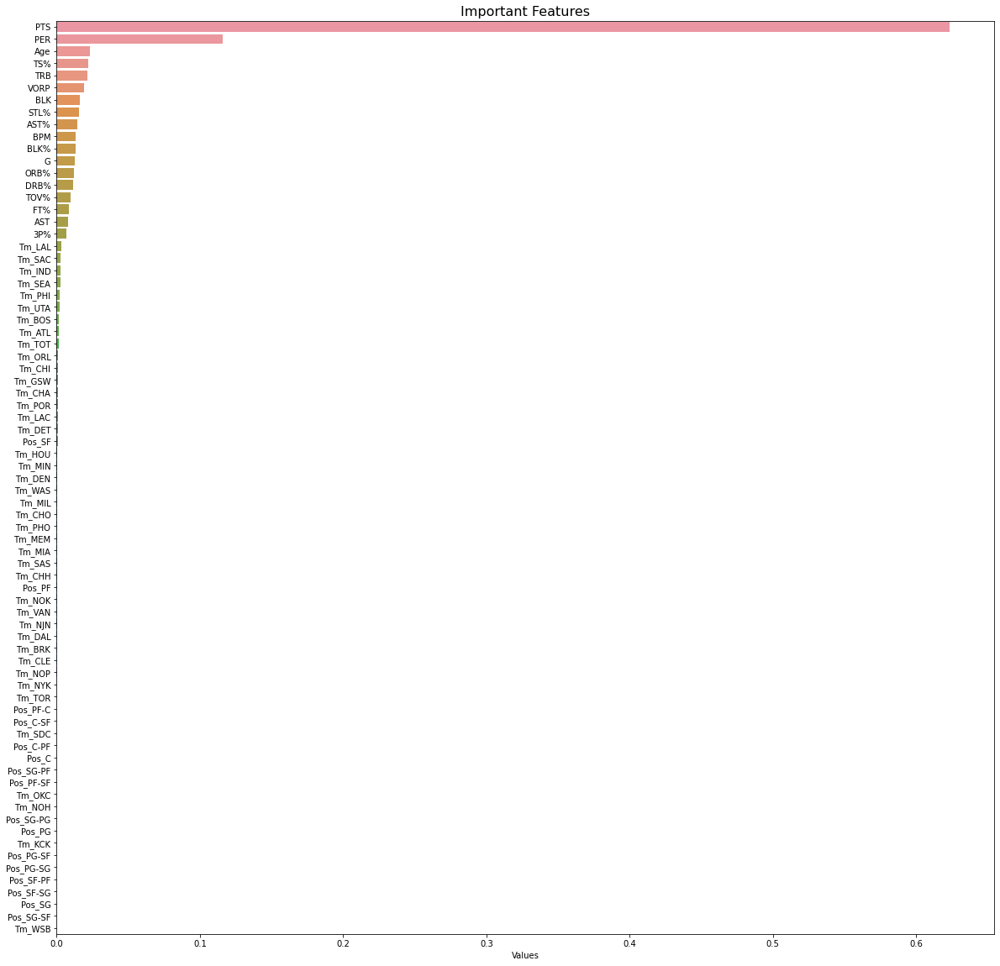

In [86]:
important_features = pd.DataFrame(model_tree.feature_importances_,X.columns,columns=['Values'])
plt.figure(figsize=(20,20))
sns.barplot(y=important_features['Values'].sort_values(ascending=False).index,x=important_features['Values'].sort_values(ascending=False))
plt.title('Important Features',size=16);

In [87]:
print(f'Given the unbalanced nature of the target variable we calculate Matthews_Coeff which is {matthews_corrcoef(y_test,predictions)}')
print(f'ROC_AUC score is {roc_auc_score(y_test,predictions)}')

Given the unbalanced nature of the target variable we calculate Matthews_Coeff which is 0.97274318139536
ROC_AUC score is 0.9891104294478528


In [88]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3260
           1       0.97      1.00      0.98      2100

    accuracy                           0.99      5360
   macro avg       0.98      0.99      0.99      5360
weighted avg       0.99      0.99      0.99      5360



when using a Decision Tree Model with Oversampling, the model is able to achieve a similar performance to Random Forest model. Based on the user they may opt for a simplier Decision Tree Model given that it takes into account fewer features or a more complex Random Forest Model that takes into account more features

In [89]:
from sklearn.tree import plot_tree

In [90]:
from sklearn.model_selection import GridSearchCV

In [91]:
from sklearn.metrics import SCORERS

In [92]:
SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_wei

In [93]:
param_grid = {'max_depth': range(1,50)}

tree_grid_model = GridSearchCV(model_tree,param_grid=param_grid,scoring='roc_auc',cv=10,verbose=2,n_jobs=2)

tree_grid_model.fit(X_train,y_train)
print("Best score found on development set:")
print()
print(tree_grid_model.best_score_)
print("Best parameters set found on development set:")
print()
print(tree_grid_model.best_params_)
print()
print("Grid scores on development set:")
print()
means = tree_grid_model.cv_results_['mean_test_score']
stds = tree_grid_model.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, tree_grid_model.cv_results_['params']):
    print("roc_auc = %0.3f (+/%0.03f) for %r" % (mean, std * 2, params))

Fitting 10 folds for each of 49 candidates, totalling 490 fits
Best score found on development set:

0.9883330300356648
Best parameters set found on development set:

{'max_depth': 46}

Grid scores on development set:

roc_auc = 0.889 (+/0.010) for {'max_depth': 1}
roc_auc = 0.937 (+/0.012) for {'max_depth': 2}
roc_auc = 0.955 (+/0.007) for {'max_depth': 3}
roc_auc = 0.962 (+/0.007) for {'max_depth': 4}
roc_auc = 0.966 (+/0.007) for {'max_depth': 5}
roc_auc = 0.969 (+/0.007) for {'max_depth': 6}
roc_auc = 0.972 (+/0.006) for {'max_depth': 7}
roc_auc = 0.974 (+/0.005) for {'max_depth': 8}
roc_auc = 0.976 (+/0.007) for {'max_depth': 9}
roc_auc = 0.978 (+/0.005) for {'max_depth': 10}
roc_auc = 0.979 (+/0.006) for {'max_depth': 11}
roc_auc = 0.979 (+/0.005) for {'max_depth': 12}
roc_auc = 0.980 (+/0.006) for {'max_depth': 13}
roc_auc = 0.981 (+/0.006) for {'max_depth': 14}
roc_auc = 0.981 (+/0.006) for {'max_depth': 15}
roc_auc = 0.981 (+/0.005) for {'max_depth': 16}
roc_auc = 0.982 (+/0.0

we observe we can significantly reduce the depth of the model without comprising much on the roc_auc score

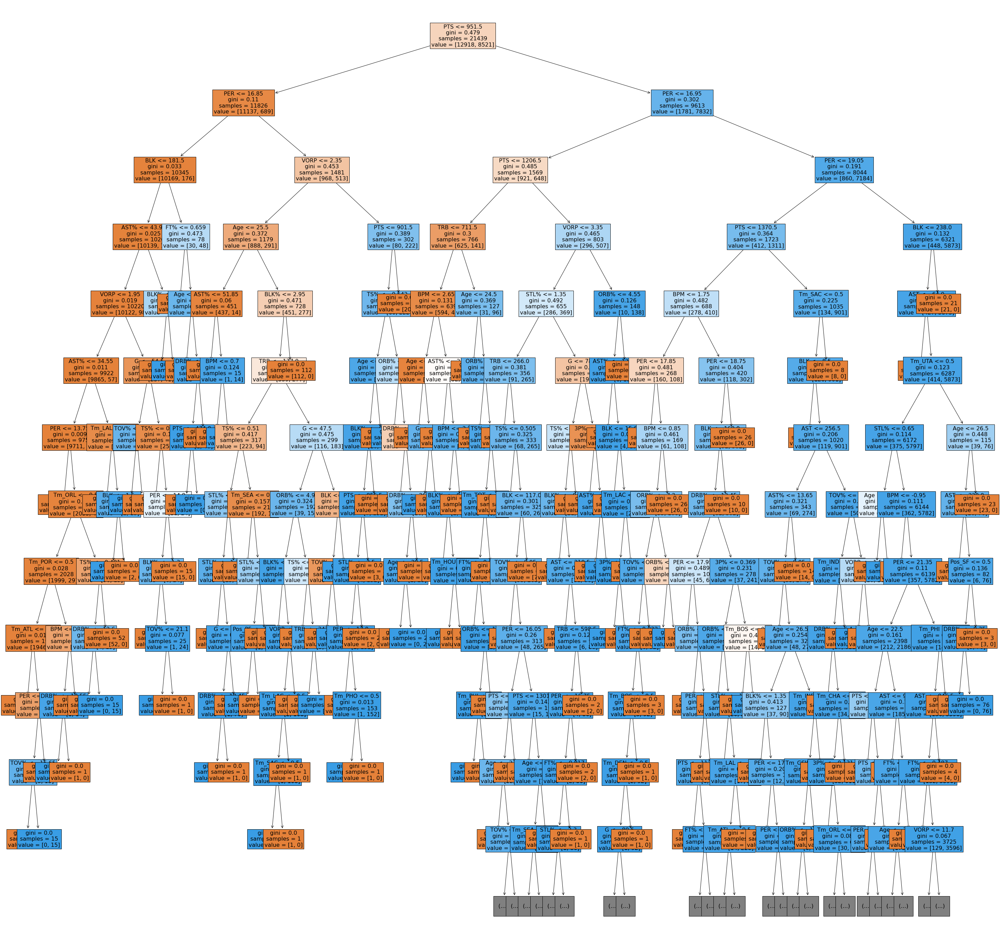

In [94]:
plt.figure(figsize=(50,50))
plot_tree(model_tree,max_depth=12,filled=True,fontsize=16,feature_names=X.columns);